In [ ]:
bucket = 's3://pakplants/'
data_key = ''
data_location = 's3://{}/{}'.format(bucket,data_key)

In [ ]:
#  Check bucket size
!aws s3 ls s3://pakplants/ --recursive --human-readable --summarize

In [ ]:
# import dataset from s3 bucket
import boto3 
import os
from botocore.exceptions import ClientError # Not necessary


s3 = boto3.resource('s3', region_name='ap-south-1') 

bucket = s3.Bucket('pakplants')
for my_bucket_object in bucket.objects.all():    
    key = my_bucket_object.key    
    print(key)    
    if not os.path.exists(os.path.dirname(key)):           
        os.makedirs(os.path.dirname(key))
   
    try:         
        bucket.download_file(key, key)     
    except ClientError as e:         
        if e.response['Error']['Code'] == "404":             
            print("No object with this key.")        
        else:             
            raise

In [ ]:
!pip install PrettyTable
!pip install -q split-folders

## Importing required modules

In [1]:
# importing essential libraries

from keras.layers import Input, Lambda, Dense, Flatten
from keras.models import Model, Sequential
from keras.applications.resnet50 import ResNet50, preprocess_input
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator, load_img
import numpy as np
from glob import glob
import random
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Using TensorFlow backend.


## Exploratory Data Analysis

In [2]:
dataset = "Pakplantsdata"

classes = os.listdir(dataset)
print("List of categories = ",classes,"\n\nNo. of categories = ", len(classes))

List of categories =  ['Soybean', 'Peach', 'Strawberry', 'Jatropha', 'Blueberry', 'Jamun', 'Pomegranate', 'Chinar', 'Background_without_leaves', 'Lemon', 'Potato', 'Grapevine', 'Grape', 'Mango', 'Apple', 'Bael', 'Gauva', 'Arjun', 'Alstonia_Scholaris', 'Pepper', 'Cherry', 'Pongamia_Pinnata', 'Raspberry', 'Corn', 'Tomato', 'Basil'] 

No. of categories =  26


Number of images of Soybean: 1400
Number of images of Peach: 1000
Number of images of Strawberry: 1000
Number of images of Jatropha: 257
Number of images of Blueberry: 1400
Number of images of Jamun: 624
Number of images of Pomegranate: 559
Number of images of Chinar: 223
Number of images of Background_without_leaves: 1143
Number of images of Lemon: 236
Number of images of Potato: 1000
Number of images of Grapevine: 565
Number of images of Grape: 1000
Number of images of Mango: 435
Number of images of Apple: 1400
Number of images of Bael: 118
Number of images of Gauva: 419
Number of images of Arjun: 452
Number of images of Alstonia_Scholaris: 433
Number of images of Pepper: 1400
Number of images of Cherry: 1000
Number of images of Pongamia_Pinnata: 598
Number of images of Raspberry: 1000
Number of images of Corn: 1162
Number of images of Tomato: 1200
Number of images of Basil: 148
Total number of images we have 20172


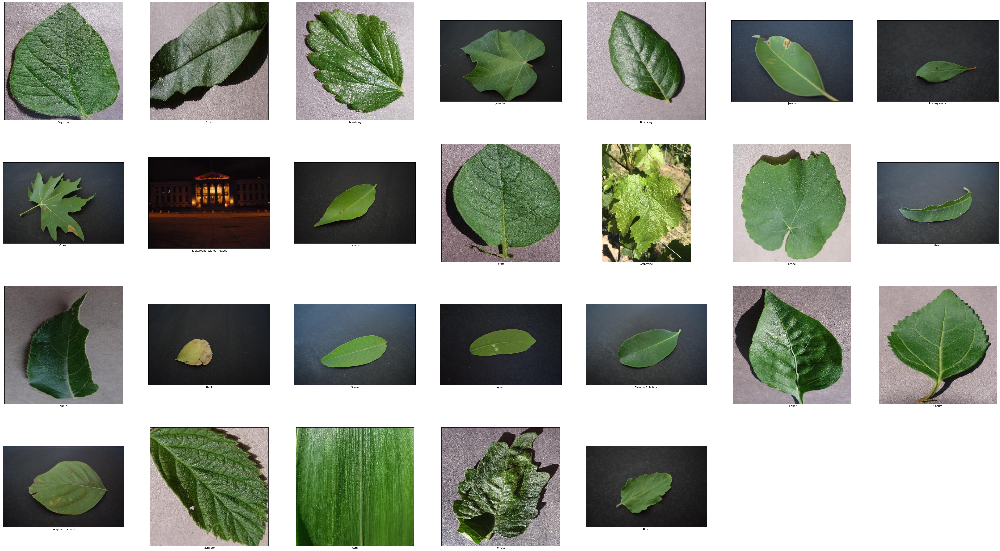

In [8]:
# Count total number of images in each directory
path='Pakplantsdata'
plt.figure(figsize=(70,70))
count=0
plant_names=[]
total_images=0
for i in os.listdir(path):
  count+=1
  plant_names.append(i)
  plt.subplot(7,7,count)

  images_path=os.listdir(path+"/"+i)
  print("Number of images of "+i+":",len(images_path),end="\n")
  total_images+=len(images_path)

  image_show=plt.imread(path+"/"+i+"/"+images_path[0])
  
  plt.imshow(image_show)
  plt.xlabel(i)
  
  plt.xticks([])
  plt.yticks([])


print("Total number of images we have",total_images)

In [10]:
filepaths = list(glob(path+'/**/*.*'))

In [13]:
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))
filepath = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')
data = pd.concat([filepath, labels], axis=1)
data = data.sample(frac=1).reset_index(drop=True)
data.head(5)

,Filepath,Label
0,Pakplantsdata/Alstonia_Scholaris/0014_0202.JPG,Alstonia_Scholaris
1,Pakplantsdata/Pepper/image (1344).JPG,Pepper
2,Pakplantsdata/Apple/image (349).JPG,Apple
3,Pakplantsdata/Gauva/0004_0194.JPG,Gauva
4,Pakplantsdata/Soybean/image (1053).JPG,Soybean


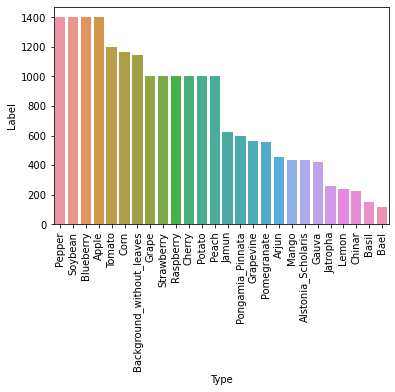

In [16]:
counts = data.Label.value_counts()
sns.barplot(x=counts.index, y=counts)
plt.xlabel('Type')
plt.xticks(rotation=90);

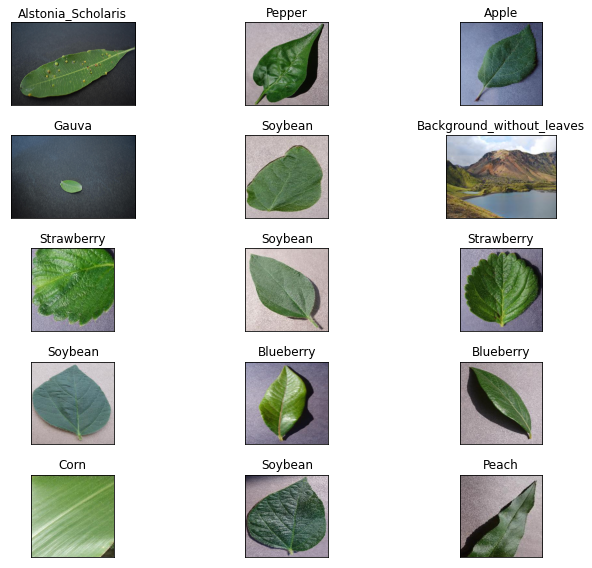

In [17]:
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(10,8), subplot_kw={'xticks':[],'yticks':[]})
for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(data.Filepath[i]))
    ax.set_title(data.Label[i])
plt.tight_layout()
plt.show()

In [18]:
!rm -r output/train/.ipynb_checkpoints
!rm -r output/test/.ipynb_checkpoints
!rm -r output/val/.ipynb_checkpoints
!rm -r Pakplantsdata/.ipynb_checkpoints

rm: cannot remove ‘output/train/.ipynb_checkpoints’: No such file or directory
rm: cannot remove ‘output/test/.ipynb_checkpoints’: No such file or directory
rm: cannot remove ‘output/val/.ipynb_checkpoints’: No such file or directory
rm: cannot remove ‘Pakplantsdata/.ipynb_checkpoints’: No such file or directory


## Split the Dataset folder

In [ ]:
import splitfolders 
splitfolders.ratio("Pakplantsdata", output="output", seed=100, ratio=(.8, .1, .1), group_prefix=None) 

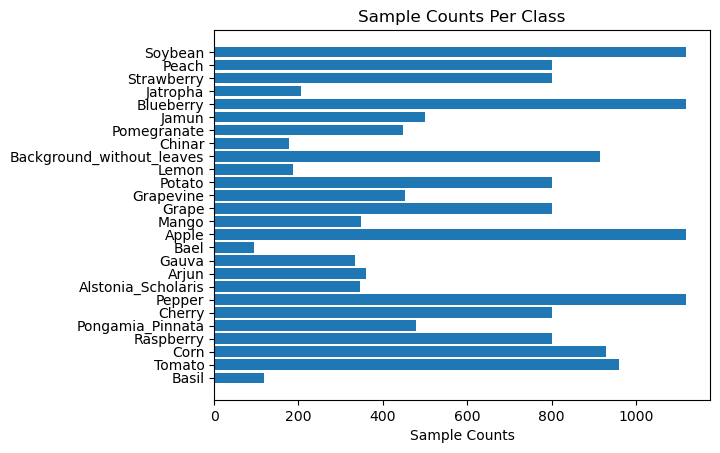

In [19]:
classes= []
sample_counts= []

for f in os.listdir('output/train'):
    train_class_path= os.path.join('output/train', f)
    if os.path.isdir(train_class_path):
        classes.append(f)
        sample_counts.append(len(os.listdir(train_class_path)))

plt.rcdefaults()
fig, ax = plt.subplots()

# Example data
y_pos = np.arange(len(classes))

ax.barh(y_pos, sample_counts, align='center')
ax.set_yticks(y_pos)
ax.set_yticklabels(classes)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Sample Counts')
ax.set_title('Sample Counts Per Class')

plt.show()

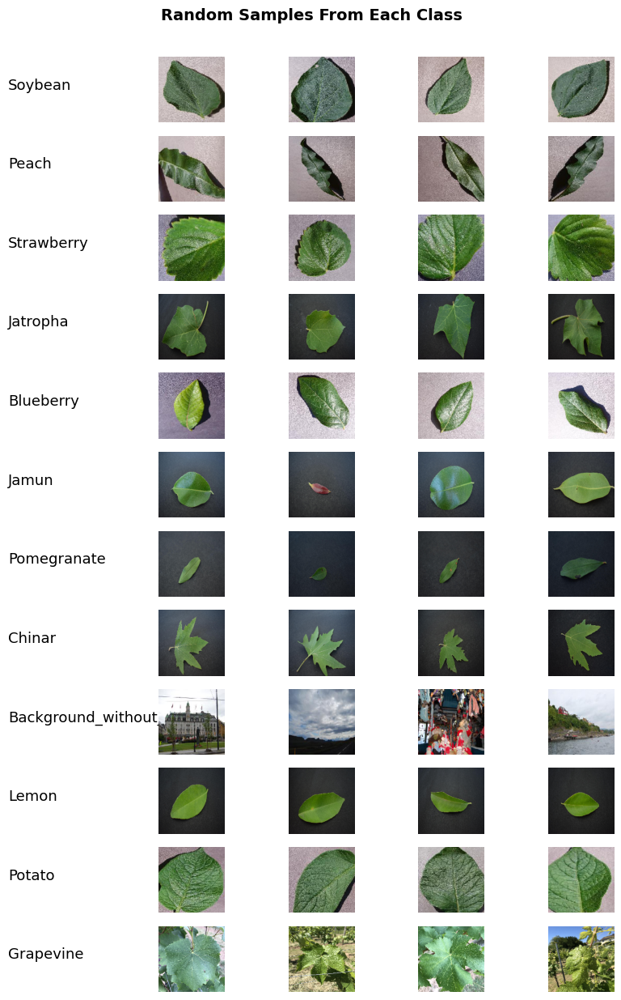

In [22]:
fig= plt.figure(figsize= (10, 15))
fig.suptitle('Random Samples From Each Class', fontsize=14, y=.92, horizontalalignment='center', weight='bold')

columns = 5
rows = 12
for i in range(12):
    sample_class= os.path.join('output/train',classes[i])
    for j in range(1,6):
        fig.add_subplot(rows, columns, i*5+j)
        plt.axis('off')
        if j==1:
            plt.text(0.0, 0.5,str(classes[i]).replace(' ','\n'), fontsize=13, wrap=True)
            continue
        random_image= os.path.join(sample_class, random.choice(os.listdir(sample_class)))
        #from keras.preprocessing.image
        img = image.load_img(random_image, target_size=(150, 150))
        img= image.img_to_array(img)
        img/=255.
        plt.imshow(img)
        
        

plt.show()

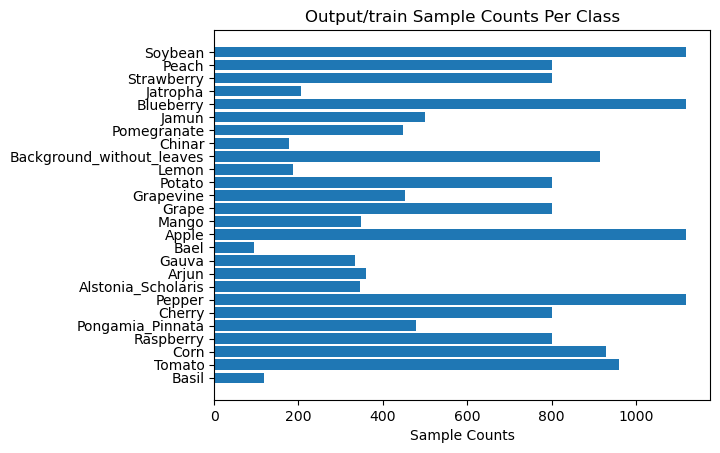

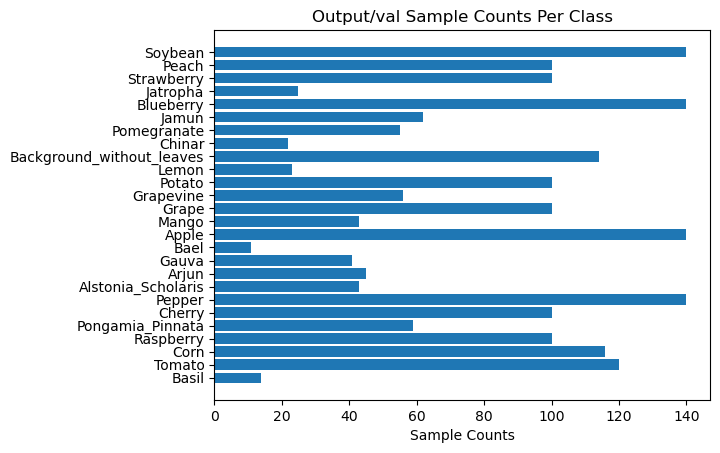

In [23]:
sample_counts= {}

for i, d in enumerate(['output/train', 'output/val']):

    classes= []
    sample_counts[d]= []

    for f in os.listdir(d):
        train_class_path= os.path.join(d, f)
        if os.path.isdir(train_class_path):
            classes.append(f)
            sample_counts[d].append(len(os.listdir(train_class_path)))

    #fig, ax= plt.subplot(221+i)
    fig, ax = plt.subplots()

    # Example data
    y_pos = np.arange(len(classes))

    ax.barh(y_pos, sample_counts[d], align='center')
    ax.set_yticks(y_pos)
    ax.set_yticklabels(classes)
    ax.invert_yaxis()  # labels read top-to-bottom
    ax.set_xlabel('Sample Counts')
    ax.set_title('{} Sample Counts Per Class'.format(d.capitalize()))

plt.show()

## Preprocessing

In [3]:
image_size = [224, 224]

train_path = 'output/train'
valid_path = 'output/test'

In [4]:
# data augmentation
train_datagen = ImageDataGenerator(rescale= 1./255,
                                  shear_range = 0.2,
                                  zoom_range = 0.2,
                                  horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

In [5]:
training_set = train_datagen.flow_from_directory('output/train',
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

Found 16132 images belonging to 26 classes.


In [6]:
test_set = test_datagen.flow_from_directory('output/test',
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

Found 2031 images belonging to 26 classes.


## Model

In [7]:
resnet = ResNet50(input_shape = image_size + [3], weights = 'imagenet', include_top=False)

/home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


In [8]:
# not training existing weights
for layer in resnet.layers:
  layer.trainable = False

In [9]:
x = Flatten()(resnet.output)

In [10]:
# adding prediction layer
prediction = Dense(26, activation='softmax')(x)

# creating model 
model = Model(inputs = resnet.input, outputs=prediction)

model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
____________________________________________________________________________________________

In [12]:
model.compile(loss = "categorical_crossentropy", optimizer='adam', metrics=['accuracy']
)

In [13]:
# fit the model
# Run the cell. It will take some time to execute
r = model.fit_generator(
  training_set,
  validation_data=test_set,
  epochs=15,
  steps_per_epoch=100,
  validation_steps=50
)

Epoch 1/15
100/100 [==============================] - 683s 7s/step - loss: 3.7230 - accuracy: 0.8159 - val_loss: 25.9321 - val_accuracy: 0.0575
Epoch 2/15
100/100 [==============================] - 657s 7s/step - loss: 1.7787 - accuracy: 0.9094 - val_loss: 29.5476 - val_accuracy: 0.0272
Epoch 3/15
100/100 [==============================] - 636s 6s/step - loss: 2.0673 - accuracy: 0.9281 - val_loss: 27.7681 - val_accuracy: 0.0442
Epoch 4/15
100/100 [==============================] - 640s 6s/step - loss: 1.6922 - accuracy: 0.9406 - val_loss: 34.8649 - val_accuracy: 0.0575
Epoch 5/15
100/100 [==============================] - 648s 6s/step - loss: 1.3704 - accuracy: 0.9516 - val_loss: 41.1297 - val_accuracy: 0.0219
Epoch 6/15
100/100 [==============================] - 681s 7s/step - loss: 0.9220 - accuracy: 0.9659 - val_loss: 42.6269 - val_accuracy: 0.0208
Epoch 7/15
100/100 [==============================] - 651s 7s/step - loss: 0.8350 - accuracy: 0.9706 - val_loss: 44.8101 - val_accuracy:

In [15]:
model.save("resnet_model_augmentation_.h5")

In [20]:

model.save('resnet_model_augmentation_')

## Model Evaluation

In [21]:
scores = model.evaluate(test_set)
scores

64/64 [==============================] - 281s 4s/step


[79.9446792602539, 0.056622352451086044]

In [24]:
import pickle
#save history
with open('resnet_model_augmentation_.pkl', 'wb') as f:
    pickle.dump(r, f)


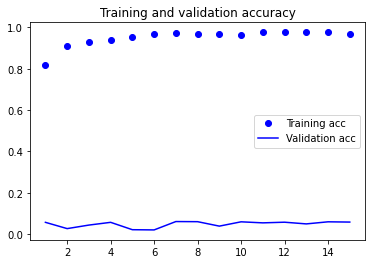

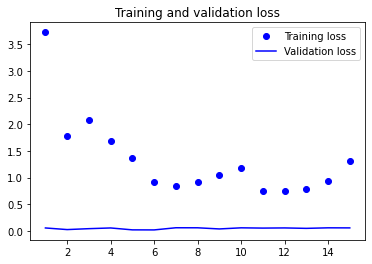

In [26]:
acc = r.history['accuracy']
val_acc = r.history['val_accuracy']
loss = r.history['loss']
val_loss = r.history['val_accuracy']
epochs = range(1, len(acc) + 1)
plt.figure()
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

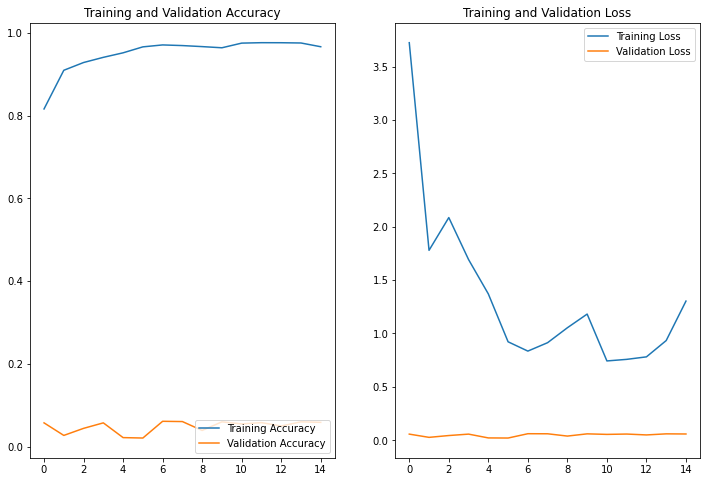

In [27]:
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(range(15), r.history['accuracy'], label='Training Accuracy')
plt.plot(range(15), r.history['val_accuracy'], label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(15), loss, label='Training Loss')
plt.plot(range(15), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


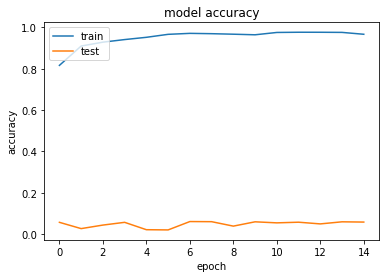

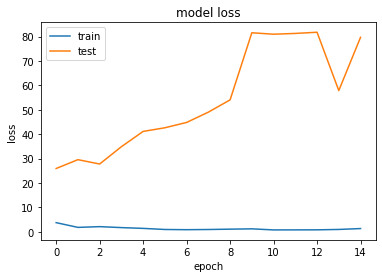

In [54]:
from keras.models import Sequential
from keras.layers import Dense
import matplotlib.pyplot as plt
import numpy

print(r.history.keys())

plt.plot(r.history['accuracy'])
plt.plot(r.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(r.history['loss'])
plt.plot(r.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [28]:
print(r.history['accuracy'])

[0.8159375, 0.909375, 0.92812103, 0.940625, 0.9515625, 0.9659375, 0.970625, 0.9690625, 0.9665625, 0.9637453, 0.975, 0.97604036, 0.9759375, 0.9753125, 0.96625]


In [ ]:
pred= model.predict_generator(test_set, steps= test_set.n, verbose=1)

In [35]:
print("Train Accuracy  : {:.2f} %".format(r.history['accuracy'][-1]*100))\

Train Accuracy  : 96.63 %


In [ ]:
predicted_class_indices=np.argmax(pred,axis=1)

prediction_labels = [label_map[k] for k in predicted_class_indices]
filenames= test_generator.filenames

In [48]:
def prepare(img_path):
    img = image.load_img(img_path, target_size=(224,224))
    x = image.img_to_array(img)
    x = x/255
    return np.expand_dims(x, axis=0)
    
    
result = model.predict([prepare('test/Mango.JPG')])

classresult=np.argmax(result,axis=1)
classresult

array([3])

In [47]:
import numpy as np
classresult=np.argmax(result,axis=1)
print(classes[classresult[0]])

Jatropha
